In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import re

import scarches
from scarches.models.scpoli import scPoli

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('white')
sns.set_context("paper", font_scale = 2)

 captum (see https://github.com/pytorch/captum).
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
scarches.__version__

'0.5.7'

In [3]:
sc.set_figure_params(frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))

In [4]:
adata_latent = sc.read('../../fetal_lung/Roche/new_20230705/adata_latent_source.h5ad')

In [5]:
adata_latent

AnnData object with n_obs × n_vars = 806646 × 10
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'leiden'
    obsm: 'X_umap'

In [6]:
# map colors
col_map = pd.read_table('gut_scpoli_color.txt', header=None, index_col=0)

In [7]:
col_map

,1
0,
biliarysystem,#A73030
intestine,#91D1C2
liver,#8F7700
lung,#F39B7F
pancreas,#B09C85
...,...
MUC13_DMBT1 positive cells,#886573
PDE1C_ACSM3 positive cells,#C05E3F
Thymocytes,#3C5939


In [8]:
col_map = dict(zip(col_map.index, col_map[1]))

In [9]:
adata_latent.obs.level_1.cat.categories.map(col_map).tolist()

['#CD534C', '#0073C2', '#c251a1', '#a3e3af', '#868686']

In [10]:
adata_latent.uns['level_1_colors'] = adata_latent.obs.level_1.cat.categories.map(col_map).tolist()
adata_latent.uns['level_2_colors'] = adata_latent.obs.level_2.cat.categories.map(col_map).tolist()
adata_latent.uns['level_3_colors'] = adata_latent.obs.level_3.cat.categories.map(col_map).tolist()

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


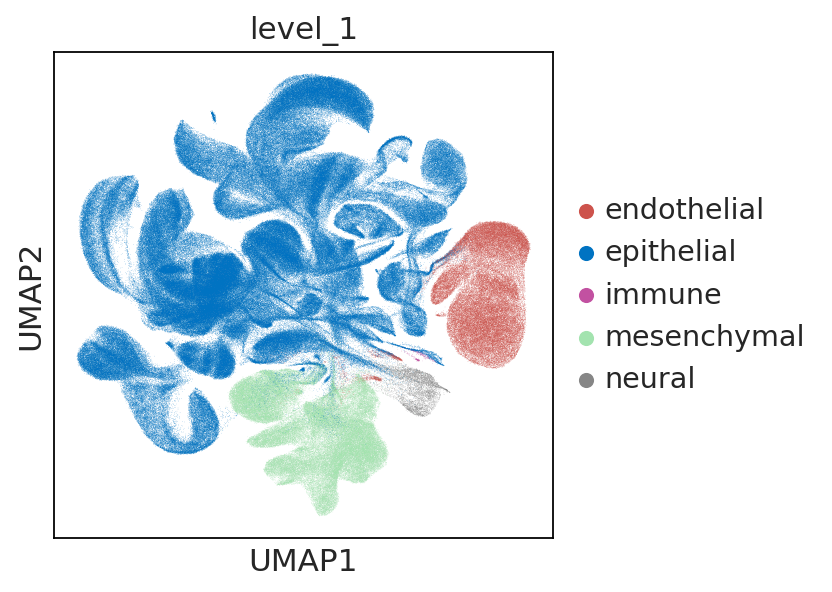

In [11]:
sc.pl.umap(adata_latent, 
           color = ['level_1'],
           ncols = 1
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


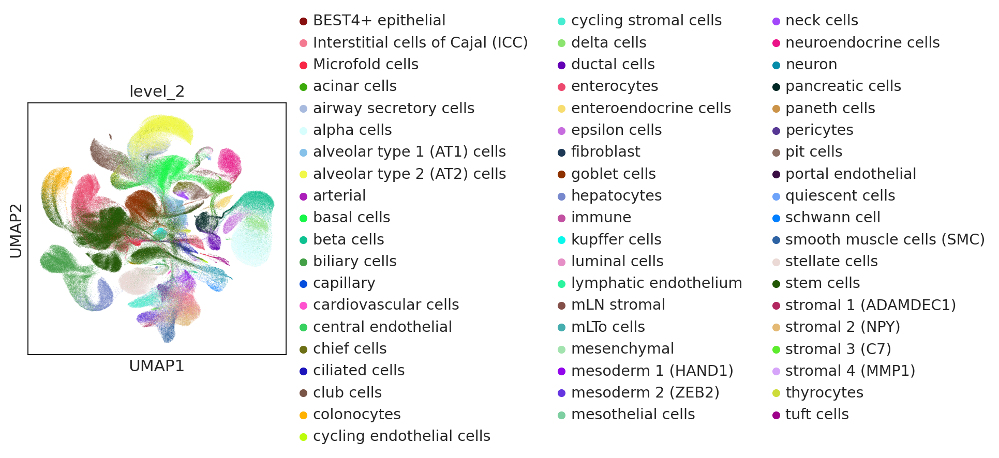

In [12]:
sc.pl.umap(adata_latent, 
           color = ['level_2'],
           ncols = 1
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


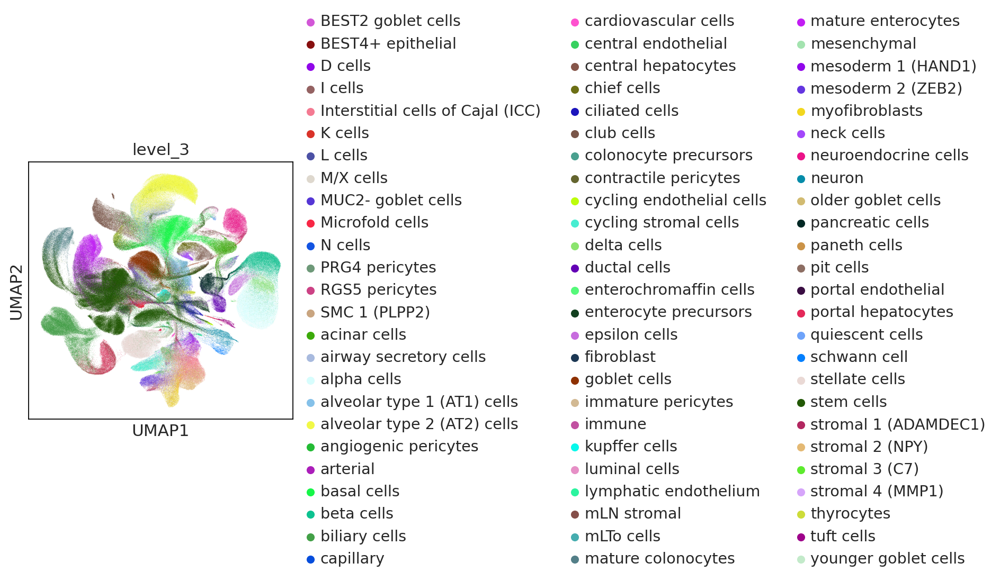

In [13]:
sc.pl.umap(adata_latent, 
           color = [ 'level_3'],
           ncols = 1
          )

In [14]:
adata_latent.uns['tissue_colors'] = adata_latent.obs.tissue.cat.categories.map(col_map).tolist()

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


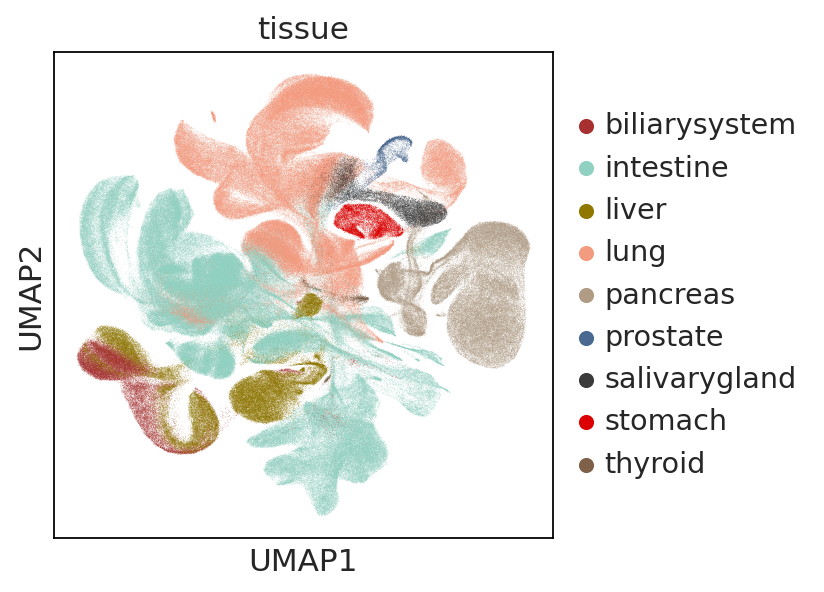

In [15]:
sc.pl.umap(adata_latent, 
           color = ['tissue'],
           ncols = 1
          )

In [16]:
adata_latent.uns['derive_colors'] = adata_latent.obs.derive.cat.categories.map(col_map).tolist()

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


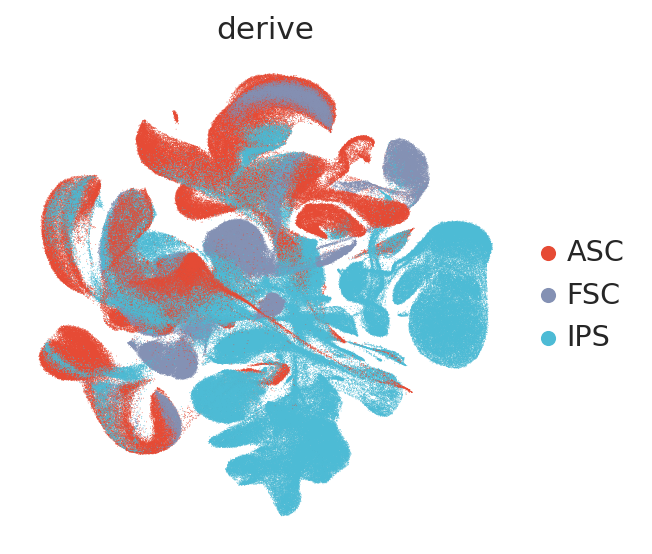

In [17]:
sc.pl.umap(adata_latent, 
           color = ['derive'],
           size = 0.5, frameon=False,
           ncols = 1, save = 'organoid_atlas_ann_derive_noframe.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


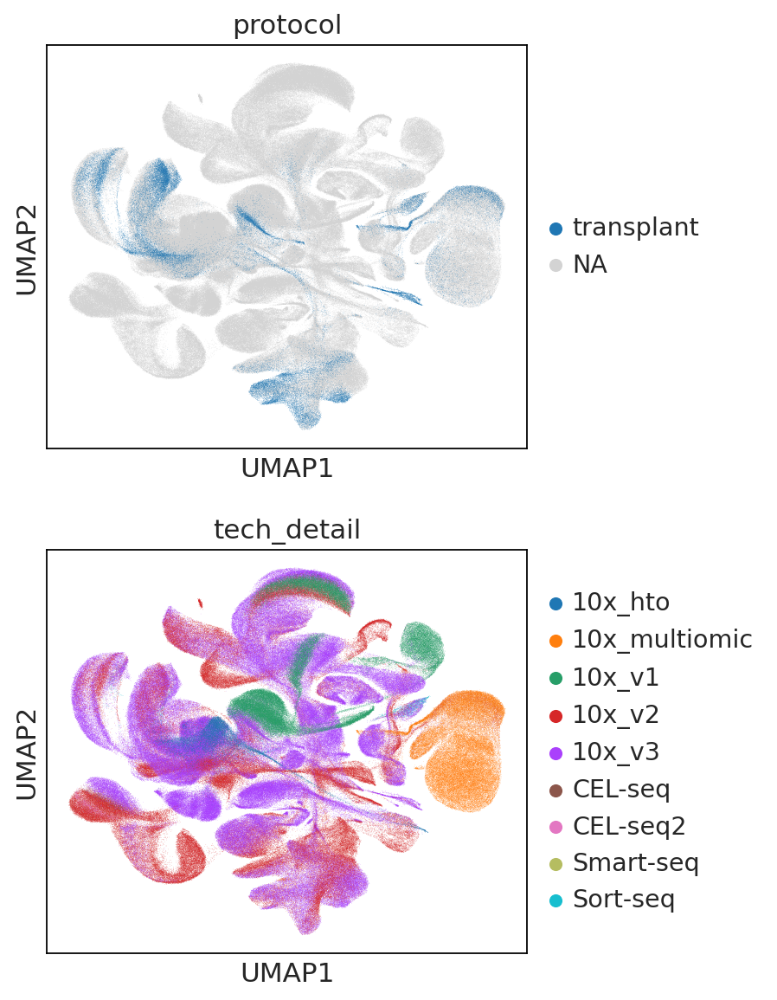

In [18]:
sc.pl.umap(adata_latent, 
           color = ['protocol','tech_detail'],
           ncols = 1
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


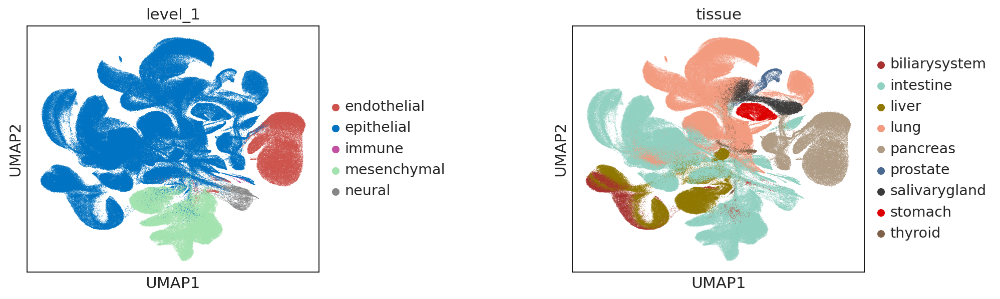

In [19]:
sc.pl.umap(adata_latent, 
           color = ['level_1', 'tissue'],
           ncols = 2, wspace = 0.7, size = 0.5
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


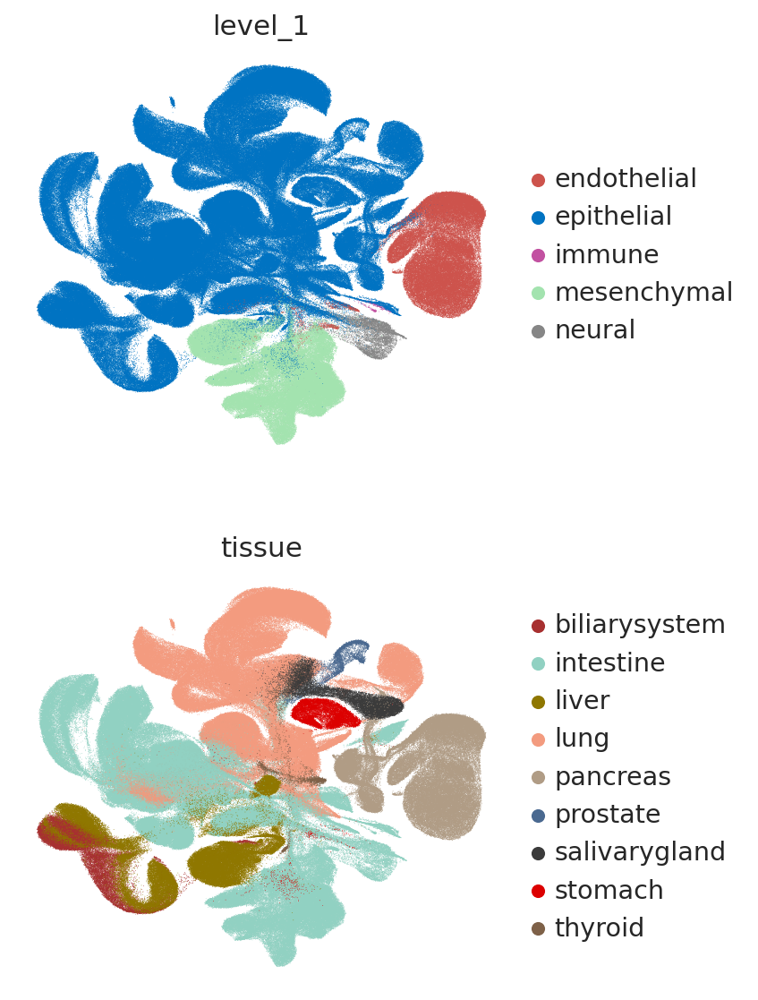

In [20]:
sc.pl.umap(adata_latent, 
           color = ['level_1', 'tissue'],
           ncols = 1, wspace = 0.2, size = 0.5,frameon=False,
           save='organoid_atlas_ann_level_1_tissue_noframe.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


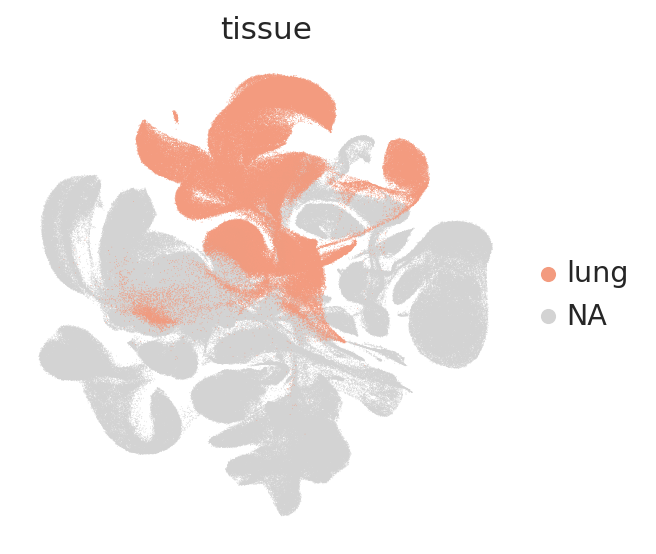

In [21]:
sc.pl.umap(adata_latent, 
           color = ['tissue'],
           groups = ['lung'],
           ncols = 1, wspace = 0.2, size = 0.5,frameon=False,
           save='organoid_atlas_ann_tissue_lung_noframe.png'
          )

In [22]:
adata_latent.uns['lung_derive_colors'] = adata_latent.obs.derive.cat.categories.map(col_map).tolist()

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


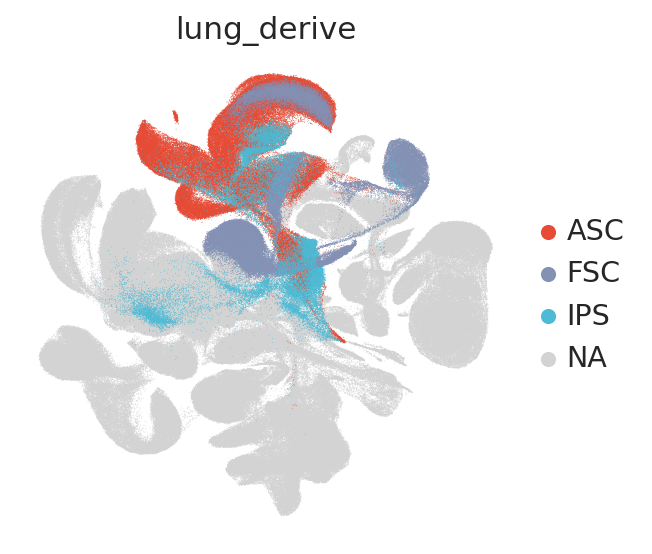

In [23]:
adata_latent.obs['lung_derive'] = np.nan
adata_latent.obs.loc[adata_latent.obs.tissue.isin(['lung']),'lung_derive'] = adata_latent.obs.derive[adata_latent.obs.tissue.isin(['lung'])]

sc.pl.umap(adata_latent, 
           color = ['lung_derive'],
#            groups = ['lung'],
           ncols = 1, wspace = 0.2, size = 0.5,frameon=False,
           save='organoid_atlas_ann_derive_lung_noframe.png'
          )

### Query Tristen healthy data 

In [24]:
adata = sc.read('../../fetal_lung/AlveolarDifferentiationD0D1D6D21.h5ad')
adata_airway = sc.read('../../fetal_lung/AirwayDifferentiationD35D56.h5ad')

In [25]:
# add ground-truth celltype annotation
query_mdata = pd.read_csv('../../fetal_lung/BTPtoAT2differentiationAnnotations.csv', index_col=1)
query_mdata

,Unnamed: 0,Annotation
CellID,,
3F_AAACCCAGTCCAGCCA-1,1,Bud Tip Progenitor
3F_AAACCCATCCGCAGTG-1,2,G2M Phase
3F_AAACGAACACGTGAGA-1,3,S Phase 1
3F_AAACGCTAGACATAGT-1,4,Bud Tip Progenitor
3F_AAACGCTCAACTGCCG-1,5,S Phase 1
...,...,...
2FABDAY21_TTTGGTTGTAGAGATT-1,11800,Day 21 AT2-like
2FABDAY21_TTTGGTTTCCCTGTTG-1,11801,Day 21 AT2-like
2FABDAY21_TTTGTTGCATCGCTCT-1,11802,Day 21 AT2-like


In [26]:
adata.obs['cell_type'] = query_mdata.reindex(adata.obs_names)['Annotation']
adata_airway.obs['cell_type'] = query_mdata.reindex(adata_airway.obs_names)['Annotation']

In [27]:
adata_airway.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,timing,type,ID,derive,batch,cell_type
35D_AAACCCAAGCCAACCC-1,,13426.0,3703,1.444958,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAAGGAGAATG-1,,45021.0,6569,2.434419,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAAGGCTATCT-1,,19425.0,5806,4.339768,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCACACTTGTGA-1,,17658.0,4276,3.069430,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAGTCCGGTCA-1,,36740.0,7093,2.710942,35 days,Airway,35D,FSC,108,NaN
...,...,...,...,...,...,...,...,...,...,...
56D2_TTTGTTGGTAAGATCA-1,,10328.0,3204,4.173122,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGGTCGTGATT-1,,23750.0,6303,5.010526,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGTCAAGGACG-1,,5164.0,2352,7.668474,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGTCATCCTAT-1,,20332.0,4814,3.570726,56 days,Airway,56D2,FSC,110,NaN


In [28]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,group,timepoint,cell_type
3F_AAACCCAGTCCAGCCA-1,threef,23998.0,5599,4.742062,Day 0,0.0,Bud Tip Progenitor
3F_AAACCCATCCGCAGTG-1,threef,19212.0,5192,4.627316,Day 0,0.0,G2M Phase
3F_AAACGAACACGTGAGA-1,threef,36746.0,6906,6.547651,Day 0,0.0,S Phase 1
3F_AAACGCTAGACATAGT-1,threef,16549.0,4649,7.680222,Day 0,0.0,Bud Tip Progenitor
3F_AAACGCTCAACTGCCG-1,threef,44977.0,7732,5.956378,Day 0,0.0,S Phase 1
...,...,...,...,...,...,...,...
2FABDAY21_TTTGGTTTCCCTGTTG-1,twoefabday21,19678.0,4693,16.790324,Day 21,21.0,Day 21 AT2-like
2FABDAY21_TTTGGTTTCCGGGACT-1,twoefabday21,11826.0,2429,60.908168,Day 21,21.0,NaN
2FABDAY21_TTTGTTGCATCGCTCT-1,twoefabday21,36069.0,6582,4.347223,Day 21,21.0,Day 21 AT2-like
2FABDAY21_TTTGTTGGTTATGACC-1,twoefabday21,47496.0,7151,6.166835,Day 21,21.0,Day 21 AT2-like


In [29]:
# adata.obs

In [30]:
# adata_airway.obs

In [31]:
adata_airway.obs = adata_airway.obs.drop(columns = ['orig.ident'])
adata_airway.obs.rename(columns = {'timing':'group','ID':'orig.ident'}, inplace=True)
adata.obs['type'] = 'Alveolar'

In [32]:
adata_airway.obs

,nCount_RNA,nFeature_RNA,percent.mt,group,type,orig.ident,derive,batch,cell_type
35D_AAACCCAAGCCAACCC-1,13426.0,3703,1.444958,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAAGGAGAATG-1,45021.0,6569,2.434419,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAAGGCTATCT-1,19425.0,5806,4.339768,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCACACTTGTGA-1,17658.0,4276,3.069430,35 days,Airway,35D,FSC,108,NaN
35D_AAACCCAGTCCGGTCA-1,36740.0,7093,2.710942,35 days,Airway,35D,FSC,108,NaN
...,...,...,...,...,...,...,...,...,...
56D2_TTTGTTGGTAAGATCA-1,10328.0,3204,4.173122,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGGTCGTGATT-1,23750.0,6303,5.010526,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGTCAAGGACG-1,5164.0,2352,7.668474,56 days,Airway,56D2,FSC,110,NaN
56D2_TTTGTTGTCATCCTAT-1,20332.0,4814,3.570726,56 days,Airway,56D2,FSC,110,NaN


In [33]:
adata = adata.concatenate(adata_airway, batch_key='batch_dataset')

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [34]:
adata.obs['group'] = adata.obs['group'] + ' (query)'

In [39]:
# rename groups
adata.obs['group'] = adata.obs.group.map({'56 days (query)':'Day 56 (query)', '35 days (query)':'Day 35 (query)',
                    'Day 1 (query)':'Day 1 (query)','Day 6 (query)':'Day 6 (query)',
                    'Day 21 (query)': 'Day 21 (query)','Day 0 (query)':'Day 0 (query)'})

In [40]:
adata.obs.group.value_counts()

group
Day 56 (query)    17040
Day 1 (query)      6657
Day 35 (query)     6387
Day 6 (query)      5088
Day 21 (query)     2876
Day 0 (query)      1324
Name: count, dtype: int64

In [41]:
adata.obs['derive'] = 'FSC (query)'
adata.obs['tissue'] = 'lung (query)'

In [42]:
ref_path_dir = '../../fetal_lung/Roche/new_20230705/gut_scpoli_model'

In [43]:
adata_ref = sc.read('../../fetal_lung/Roche/new_20230705/gut_scpoli_integration.h5ad')
adata_ref

AnnData object with n_obs × n_vars = 806646 × 2000
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'leiden', 'leiden_10.0', 'level_1_late', 'level_2_late', 'level_3_late'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scPoli', 'X_umap', 'X_umap_min', 'X_umap_sc'
    layers: 'ambiguous', 'counts', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [44]:
adata_ref.raw.var_names

Index(['A1BG-AS1', 'A2M-AS1', 'A2ML1-AS1', 'A2ML1-AS2', 'AADACL2-AS1', 'AATBC',
       'ABALON', 'ABCA9-AS1', 'ABCC5-AS1', 'ABHD15-AS1',
       ...
       'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX',
       'ZZEF1', 'ZZZ3'],
      dtype='object', length=25645)

In [45]:
adata

AnnData object with n_obs × n_vars = 39372 × 22395
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'group', 'timepoint', 'cell_type', 'type', 'derive', 'batch', 'batch_dataset', 'tissue'
    var: 'features'

In [46]:
adata.var_names

Index(['AL627309.1', 'AL627309.5', 'LINC01409', 'LINC01128', 'LINC00115',
       'FAM41C', 'NOC2L', 'KLHL17', 'PLEKHN1', 'PERM1',
       ...
       'CECR3', 'AC000085.1', 'AC007308.1', 'ARX', 'XIST', 'RHOXF1', 'SH2D1A',
       'CDR1', 'TREX2', 'AC245140.1'],
      dtype='object', length=22395)

In [47]:
adata.X[1:10,1:10].toarray()

array([[0., 2., 0., 0., 0., 2., 1., 0., 0.],
       [0., 0., 1., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.]])

In [48]:
scpoli_model = scarches.models.scpoli.scPoli.load(ref_path_dir, adata_ref)

AnnData object with n_obs × n_vars = 806646 × 2000
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'leiden', 'leiden_10.0', 'level_1_late', 'level_2_late', 'level_3_late'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scPoli', 'X_umap', 'X_umap_min', 'X_umap_sc'
    layers: 'ambiguous', 'counts', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'
Embedding dictionary:
 	Num conditions: 218
 	Embeddi

In [49]:
adata.obs['level_1'] = 'na'
adata.obs['level_2'] = 'na'

In [51]:
# adata.write('timecourse_Airway_AlveolarDifferentiation.h5ad')

In [52]:
import anndata
from anndata import AnnData
from scipy.sparse import csr_matrix


genes_to_add = adata_ref.var_names.difference(adata.var_names)
needs_padding = len(genes_to_add) > 0
if needs_padding:
    adata_padding = AnnData(
        csr_matrix(np.zeros((adata.n_obs, len(genes_to_add))))
    )
    adata_padding.var_names = genes_to_add
    adata_padding.obs_names = adata.obs_names
    # Concatenate object
    adata_out = anndata.concat(
        [adata[:,adata.var_names.intersection(adata_ref.var_names)], adata_padding],
        axis=1,
        join="outer",
        index_unique=None,
        merge="unique",
    )
if not adata_ref.var_names.equals(adata_out.var_names):
    adata_out._inplace_subset_var(adata_ref.var_names)

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [53]:
adata = adata_out.copy()

In [54]:
print(adata_ref.shape)
print(adata.shape)

(806646, 2000)
(39372, 2000)


In [55]:
# adata_ = adata.copy()
# adata_.X = adata_.X.todense()

In [56]:
adata_ref.var_names

Index(['ADAMTS9-AS2', 'BHLHE40-AS1', 'CARMN', 'CASC15', 'CASC19', 'CDKN2B-AS1',
       'CRNDE', 'CYTOR', 'DNM3OS', 'DRAIC',
       ...
       'ZG16', 'ZG16B', 'ZMAT3', 'ZNF165', 'ZNF292', 'ZNF385D', 'ZNF503',
       'ZNF703', 'ZNF804A', 'ZWINT'],
      dtype='object', length=2000)

In [57]:
adata_ref.X[1:10,1:10].toarray()

array([[0.  , 0.  , 0.  , 1.48, 0.  , 0.  , 1.48, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.53, 0.  , 0.53, 0.88, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 2.15, 0.  , 0.67, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 2.04, 0.  , 0.56, 1.7 , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.52, 0.  , 1.38, 1.03, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.46, 1.21, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.59, 0.  , 0.  , 1.59, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.96, 0.  , 1.11, 1.11, 0.  , 0.  ]],
      dtype=float32)

In [58]:
adata.layers['counts'] = adata.X.copy()

In [59]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [60]:
adata.X[1:10,1:10].toarray()

array([[0.  , 0.  , 0.  , 0.  , 0.  , 2.2 , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.42, 0.42, 0.  , 1.55, 0.72, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 2.5 , 0.  , 0.75, 0.75, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.46, 0.  , 2.01, 1.02, 0.  , 0.46],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.27, 0.  , 0.  , 1.07],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.79, 0.54, 0.  , 0.89],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.7 , 0.7 , 0.  , 0.  ],
       [0.  , 0.  , 1.02, 0.  , 0.  , 1.7 , 0.  , 0.  , 1.3 ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.31, 1.31, 0.  , 0.  ]])

In [61]:
adata.X = adata.X.astype(np.float32)

In [62]:
adata.obs['level_1'] = adata.obs.level_1.astype('category')
adata.obs['level_2'] = adata.obs.level_2.astype('category')

In [63]:
adata.X = adata.X.todense()

In [64]:
adata

AnnData object with n_obs × n_vars = 39372 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'group', 'timepoint', 'cell_type', 'type', 'derive', 'batch', 'batch_dataset', 'tissue', 'level_1', 'level_2'
    var: 'features'
    uns: 'log1p'
    layers: 'counts'

In [65]:
adata.obs['sample_id'] = adata.obs['orig.ident']

In [66]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,group,timepoint,cell_type,type,derive,batch,batch_dataset,tissue,level_1,level_2,sample_id
3F_AAACCCAGTCCAGCCA-1-0,threef,23998.0,5599,4.742062,Day 0 (query),0.0,Bud Tip Progenitor,Alveolar,FSC (query),NaN,0,lung (query),na,na,threef
3F_AAACCCATCCGCAGTG-1-0,threef,19212.0,5192,4.627316,Day 0 (query),0.0,G2M Phase,Alveolar,FSC (query),NaN,0,lung (query),na,na,threef
3F_AAACGAACACGTGAGA-1-0,threef,36746.0,6906,6.547651,Day 0 (query),0.0,S Phase 1,Alveolar,FSC (query),NaN,0,lung (query),na,na,threef
3F_AAACGCTAGACATAGT-1-0,threef,16549.0,4649,7.680222,Day 0 (query),0.0,Bud Tip Progenitor,Alveolar,FSC (query),NaN,0,lung (query),na,na,threef
3F_AAACGCTCAACTGCCG-1-0,threef,44977.0,7732,5.956378,Day 0 (query),0.0,S Phase 1,Alveolar,FSC (query),NaN,0,lung (query),na,na,threef
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56D2_TTTGTTGGTAAGATCA-1-1,56D2,10328.0,3204,4.173122,Day 56 (query),NaN,NaN,Airway,FSC (query),110,1,lung (query),na,na,56D2
56D2_TTTGTTGGTCGTGATT-1-1,56D2,23750.0,6303,5.010526,Day 56 (query),NaN,NaN,Airway,FSC (query),110,1,lung (query),na,na,56D2
56D2_TTTGTTGTCAAGGACG-1-1,56D2,5164.0,2352,7.668474,Day 56 (query),NaN,NaN,Airway,FSC (query),110,1,lung (query),na,na,56D2
56D2_TTTGTTGTCATCCTAT-1-1,56D2,20332.0,4814,3.570726,Day 56 (query),NaN,NaN,Airway,FSC (query),110,1,lung (query),na,na,56D2


In [67]:
scpoli_query = scPoli.load_query_data(
        adata=adata,
        reference_model=scpoli_model,
        unknown_ct_names = ['na'],
        labeled_indices=[],
    )

Embedding dictionary:
 	Num conditions: 225
 	Embedding dim: 3
Encoder Architecture:
	Input Layer in, out and cond: 2000 898 3
	Mean/Var Layer in/out: 898 10
Decoder Architecture:
	First Layer in, out and cond:  10 898 3
	Output Layer in/out:  898 2000 



In [68]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [69]:
scpoli_query.train(
    n_epochs=20,
    pretraining_epochs=4,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=100
)

 |████----------------| 20.0%  - val_loss: 937.3225038590 - val_cvae_loss: 937.3225038590
Initializing unlabeled prototypes with Leiden-Clustering with an unknown number of clusters.


/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python

Leiden Clustering succesful. Found 33 clusters.
 |████████████████████| 100.0%  - val_loss: 932.4070296749 - val_cvae_loss: 932.4070296749 - val_prototype_loss: 0.0000000000 - val_unlabeled_loss: 0.0000000000


In [70]:
scpoli_query.model.eval()
# embd = scpoli_query.get_latent(
#         adata_ref.X,
#         adata_ref.obs.sample_id,
#         mean=True
#     )

# embd = sc.AnnData(embd)
# embd.obs_names = adata_ref.obs_names
# embd.obs = adata_ref.obs.copy()
# embd.obs['source'] = 'reference_organoid'

scpoli(
  (embedding): Embedding(225, 3, max_norm=1.0)
  (encoder): Encoder(
    (FC): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=2000, out_features=898, bias=True)
        (cond_L): Linear(in_features=3, out_features=898, bias=False)
      )
      (N0): LayerNorm((898,), eps=1e-05, elementwise_affine=False)
      (A0): ReLU()
    )
    (mean_encoder): Linear(in_features=898, out_features=10, bias=True)
    (log_var_encoder): Linear(in_features=898, out_features=10, bias=True)
  )
  (decoder): Decoder(
    (FirstL): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=10, out_features=898, bias=False)
        (cond_L): Linear(in_features=3, out_features=898, bias=False)
      )
      (N0): LayerNorm((898,), eps=1e-05, elementwise_affine=False)
      (A0): ReLU()
    )
    (HiddenL): Sequential()
    (mean_decoder): Sequential(
      (0): Linear(in_features=898, out_features=2000, bias=True)
      (1): Softmax(dim=-1)
    )
  )
)

In [71]:
adata.obs.group.value_counts()

group
Day 56 (query)    17040
Day 1 (query)      6657
Day 35 (query)     6387
Day 6 (query)      5088
Day 21 (query)     2876
Day 0 (query)      1324
Name: count, dtype: int64

In [72]:
embd_query = scpoli_query.get_latent(
        adata.X,
        adata.obs.sample_id,
        mean=True
    )
embd_query = sc.AnnData(embd_query)
embd_query.obs_names = adata.obs_names
embd_query.obs = adata.obs.copy()
embd_query.obs['source'] = 'Airway-AlveolarDifferentiation timecourse'

In [73]:
embd_query

AnnData object with n_obs × n_vars = 39372 × 10
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'group', 'timepoint', 'cell_type', 'type', 'derive', 'batch', 'batch_dataset', 'tissue', 'level_1', 'level_2', 'sample_id', 'source'

In [74]:
import anndata as ad
import umap
import pickle
# embd = ad.concat((embd,embd_query), join = 'outer')

adata_latent.obs['source'] = 'HEOA'
# embd = ad.concat((adata_latent,embd_query), join = 'outer')

# model = umap.UMAP(n_neighbors=5, random_state=42, min_dist=0.5).fit(adata_latent.X)
model = pickle.load(open('umap_model.sav','rb'))
embd_query.obsm['X_umap'] = model.transform(embd_query.X)
embd = ad.concat((adata_latent,embd_query), join = 'outer')

In [75]:
pd.set_option("display.max_columns", None)

embd.obs

,initial_size_spliced,initial_size_unspliced,initial_size,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_genes,sample_id,level_1,level_2,level_3,sort_batch,Cell_type,n_counts,batch,publication,sample_name,tissue,derive,detail_tissue,time,time2,main_cells,protocol,tech,tech_detail,molecular,gel,leiden,lung_derive,source,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,group,timepoint,cell_type,type,batch_dataset
AAACCTGAGCCACGTC-0,8713.0,4669.0,8713.0,3272.0,11476.0,1075.0,9.367375,3879.0,33.800976,0.0,0.0,3272.0,Sampaziotis_Science_2021_ORG_CBD_1,epithelial,biliary cells,biliary cells,NaN,NaN,NaN,0,Sampaziotis_Science_2021,ORG_CBD_1,biliarysystem,ASC,common_bile_duct,NaN,NaN,NaN,NaN,10x,10x_v2,NaN,NaN,7,NaN,HEOA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCTGAGTATGACA-0,3851.0,760.0,3851.0,1649.0,4783.0,713.0,14.906962,1015.0,21.220991,0.0,0.0,1649.0,Sampaziotis_Science_2021_ORG_CBD_1,epithelial,biliary cells,biliary cells,NaN,NaN,NaN,0,Sampaziotis_Science_2021,ORG_CBD_1,biliarysystem,ASC,common_bile_duct,NaN,NaN,NaN,NaN,10x,10x_v2,NaN,NaN,7,NaN,HEOA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCTGCACACATGT-0,3273.0,50.0,3273.0,1424.0,4138.0,4.0,0.096665,1382.0,33.397778,0.0,0.0,1424.0,Sampaziotis_Science_2021_ORG_CBD_1,epithelial,biliary cells,biliary cells,NaN,NaN,NaN,0,Sampaziotis_Science_2021,ORG_CBD_1,biliarysystem,ASC,common_bile_duct,NaN,NaN,NaN,NaN,10x,10x_v2,NaN,NaN,7,NaN,HEOA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCTGCACGACGAA-0,17792.0,5242.0,17792.0,4520.0,22766.0,1015.0,4.458403,6835.0,30.022842,0.0,0.0,4520.0,Sampaziotis_Science_2021_ORG_CBD_1,epithelial,biliary cells,biliary cells,NaN,NaN,NaN,0,Sampaziotis_Science_2021,ORG_CBD_1,biliarysystem,ASC,common_bile_duct,NaN,NaN,NaN,NaN,10x,10x_v2,NaN,NaN,7,NaN,HEOA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCTGCAGCTGGCT-0,27493.0,9347.0,27493.0,5846.0,35980.0,2214.0,6.153419,11453.0,31.831573,0.0,0.0,5846.0,Sampaziotis_Science_2021_ORG_CBD_1,epithelial,biliary cells,biliary cells,NaN,NaN,NaN,0,Sampaziotis_Science_2021,ORG_CBD_1,biliarysystem,ASC,common_bile_duct,NaN,NaN,NaN,NaN,10x,10x_v2,NaN,NaN,7,NaN,HEOA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56D2_TTTGTTGGTAAGATCA-1-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56D2,na,na,NaN,NaN,NaN,NaN,110,NaN,NaN,lung (query),FSC (query),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Airway-AlveolarDifferentiation timecourse,56D2,10328.0,3204.0,4.173122,Day 56 (query),NaN,NaN,Airway,1
56D2_TTTGTTGGTCGTGATT-1-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56D2,na,na,NaN,NaN,NaN,NaN,110,NaN,NaN,lung (query),FSC (query),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Airway-AlveolarDifferentiation timecourse,56D2,23750.0,6303.0,5.010526,Day 56 (query),NaN,NaN,Airway,1
56D2_TTTGTTGTCAAGGACG-1-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56D2,na,na,NaN,NaN,NaN,NaN,110,NaN,NaN,lung (query),FSC (query),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Airway-AlveolarDifferentiation timecourse,56D2,5164.0,2352.0,7.668474,Day 56 (query),NaN,NaN,Airway,1
56D2_TTTGTTGTCATCCTAT-1-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56D2,na,na,NaN,NaN,NaN,NaN,110,NaN,NaN,lung (query),FSC (query),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Airway-AlveolarDifferentiation timecourse,56D2,20332.0,4814.0,3.570726,Day 56 (query),NaN,NaN,Airway,1


In [76]:
# sc.pp.neighbors(embd, n_neighbors=5)
# sc.tl.umap(embd, random_state=42, min_dist=0.5)

In [77]:
embd

AnnData object with n_obs × n_vars = 846018 × 10
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample_id', 'level_1', 'level_2', 'level_3', 'sort_batch', 'Cell_type', 'n_counts', 'batch', 'publication', 'sample_name', 'tissue', 'derive', 'detail_tissue', 'time', 'time2', 'main_cells', 'protocol', 'tech', 'tech_detail', 'molecular', 'gel', 'leiden', 'lung_derive', 'source', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'group', 'timepoint', 'cell_type', 'type', 'batch_dataset'
    obsm: 'X_umap'

In [78]:
# NN-graph is constructed on concatenated embedding but umap coordinates for the reference are replaced with the pre-computed umap
# embd.obsm['X_umap'][:latent_adata.shape[0],:] = latent_adata.obsm['X_umap']

In [79]:
col_map['FSC (query)'] = '#99f0ca'
col_map['lung (query)'] = '#535a3b'
col_map['na'] = '#e5f6c6'

In [80]:
embd.obs['tissue'] = embd.obs.tissue.astype('category')
embd.obs['derive'] = embd.obs.derive.astype('category')

In [81]:
# add color maps
embd.uns['level_1_colors'] = embd.obs.level_1.cat.categories.map(col_map).tolist()
embd.uns['level_2_colors'] = embd.obs.level_2.cat.categories.map(col_map).tolist()
embd.uns['level_3_colors'] = embd.obs.level_3.cat.categories.map(col_map).tolist()
embd.uns['tissue_colors'] = embd.obs.tissue.cat.categories.map(col_map).tolist()
embd.uns['derive_colors'] = embd.obs.derive.cat.categories.map(col_map).tolist()

In [82]:
sc.set_figure_params(figsize=(4, 4))

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


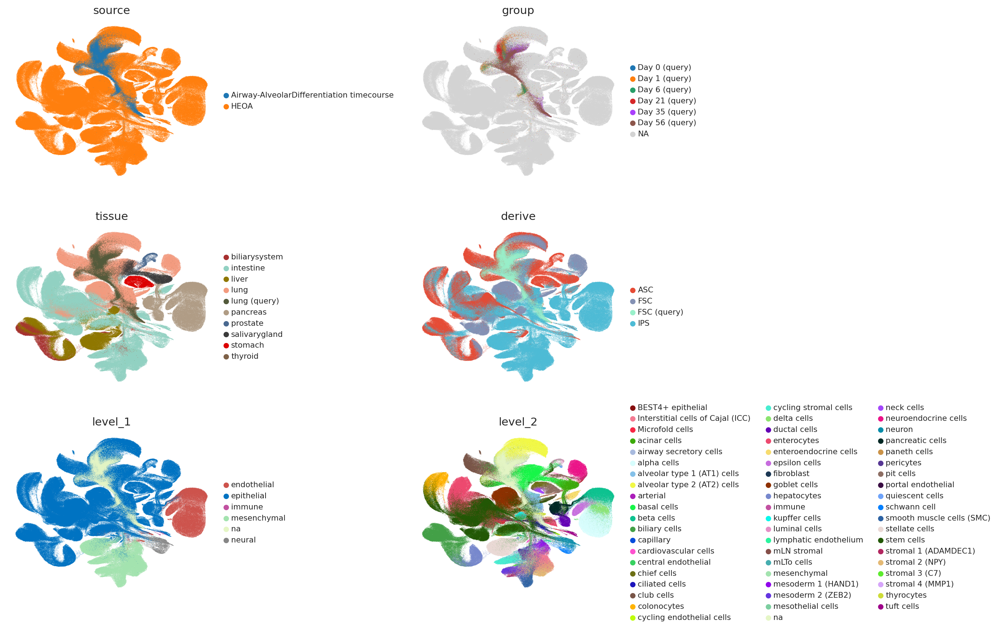

In [83]:
sc.pl.umap(embd, 
           color = ['source', 'group','tissue', 'derive','level_1','level_2'],
           ncols = 2, wspace = 0.75, legend_fontsize= 'x-small', size = 0.5, frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


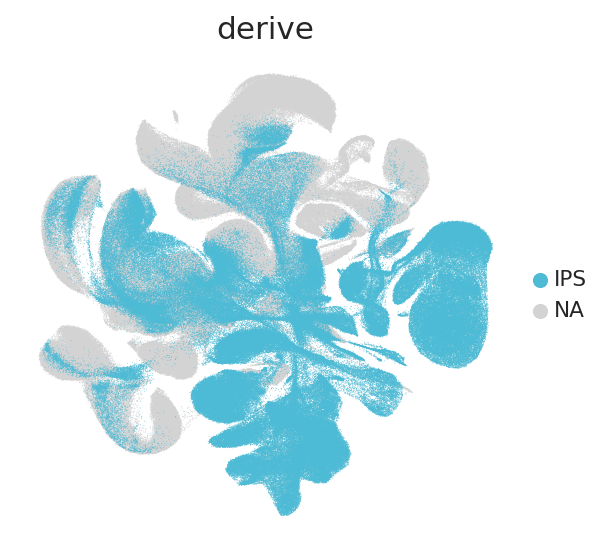

In [84]:
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['IPS'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
#            save = 'AlveolarDifferentiationD0D1D6D21_map_allOrganoid_ann_derive.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


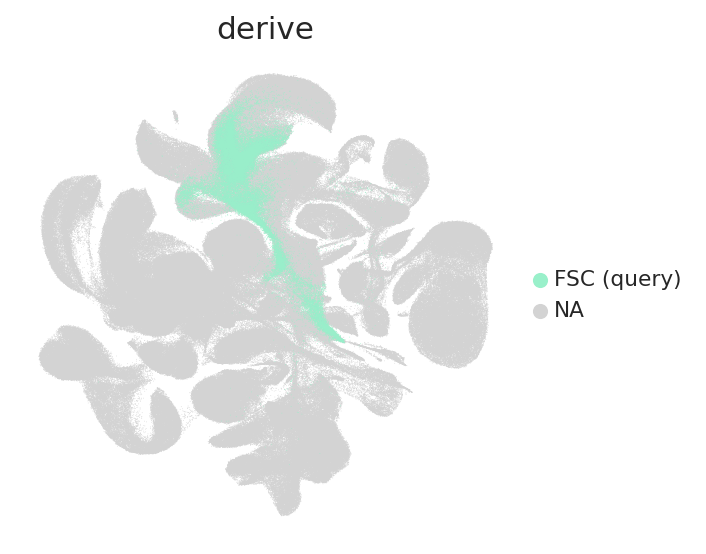

In [85]:
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['FSC (query)'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_derive_fsc_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


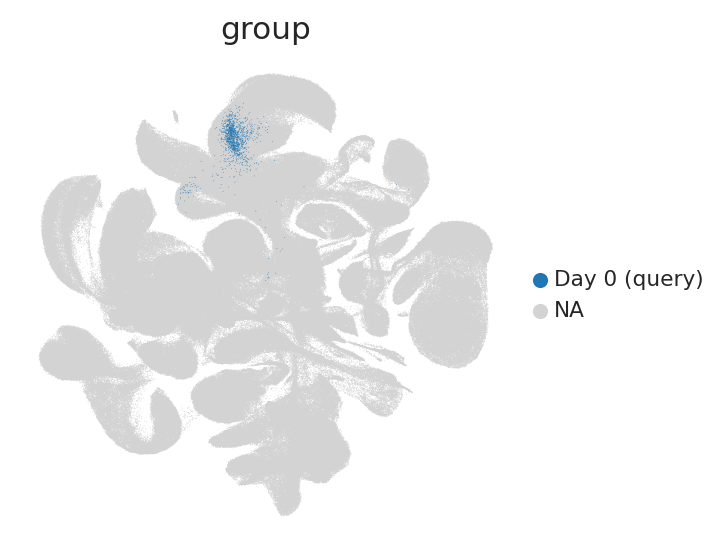

In [87]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.2, legend_fontsize= 'x-small', size = 0.5,
           groups = ['Day 0 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d0_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


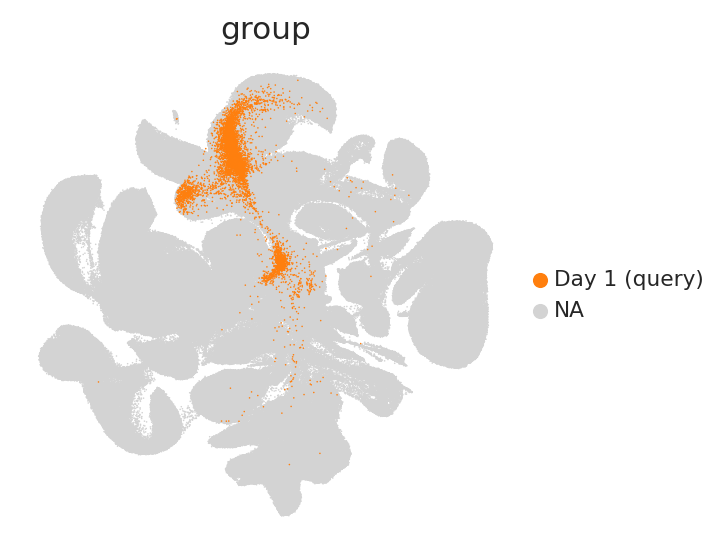

In [88]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 1 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d1_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


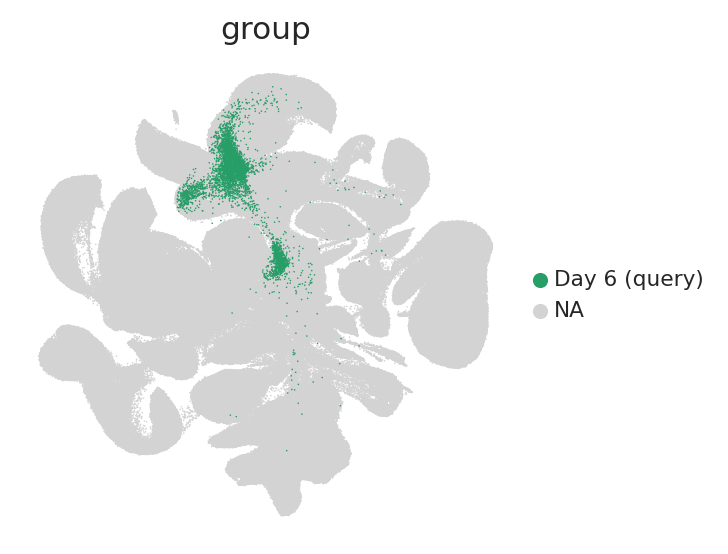

In [89]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 6 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d6_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


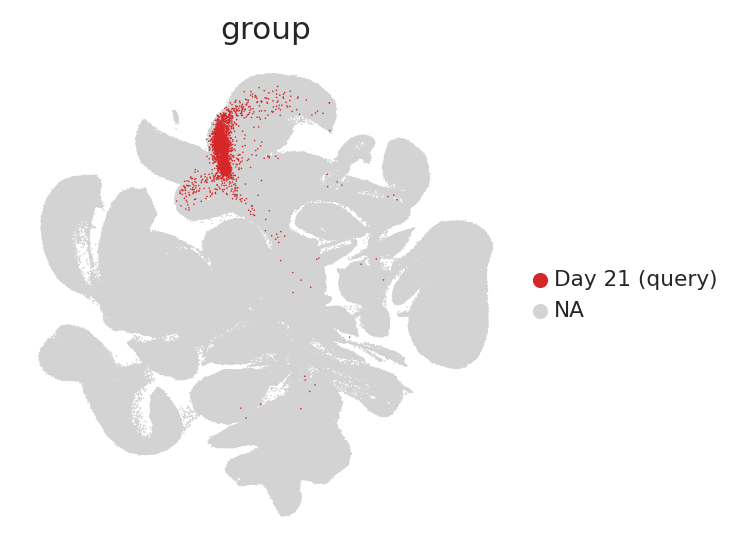

In [90]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 21 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d21_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


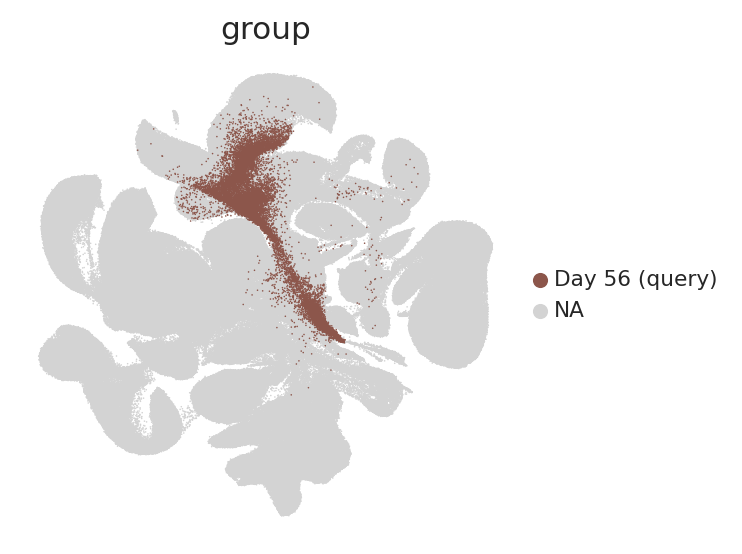

In [91]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 56 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d56_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


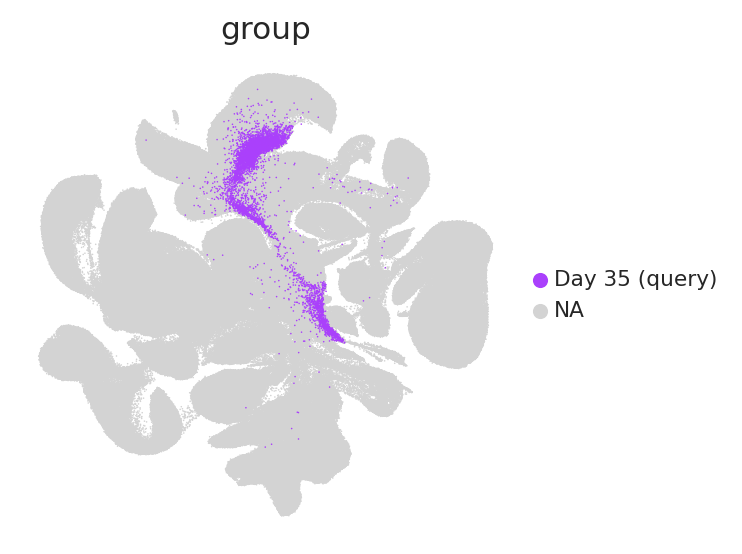

In [92]:
sc.pl.umap(embd, 
           color = ['group',],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 2,
           groups = ['Day 35 (query)'], frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_group_d35_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


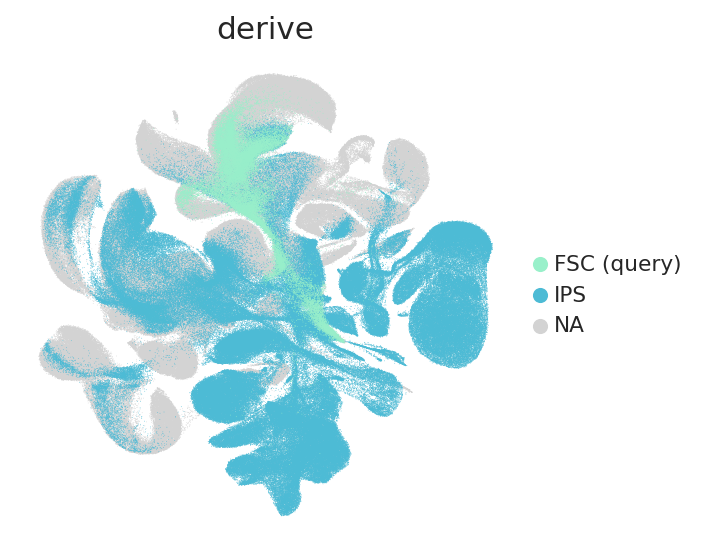

In [93]:
#IPS vs ips
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['IPS','FSC (query)'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
#            save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_derive_query.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


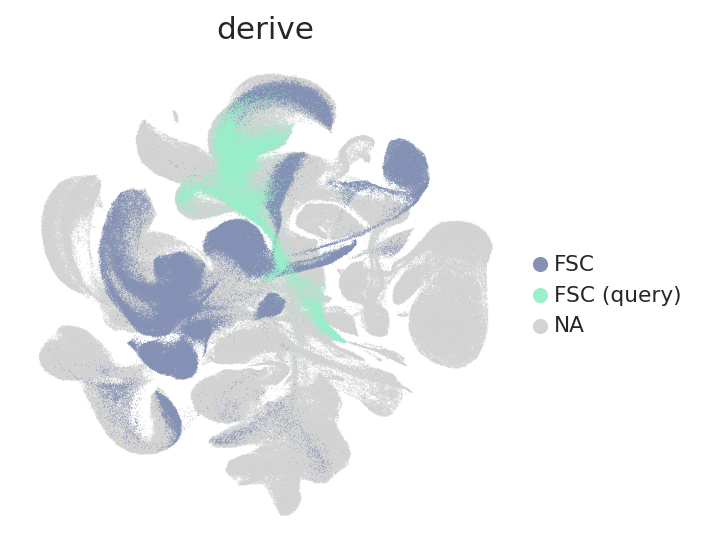

In [94]:
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['FSC','FSC (query)'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
           save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_derive_query_FSC_110723.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


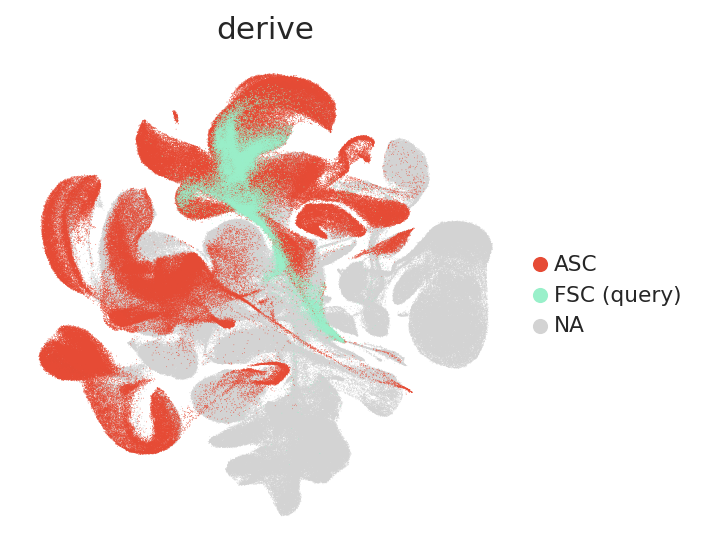

In [95]:
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['ASC','FSC (query)'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
#            save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_derive_query_FSC.png'
          )

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


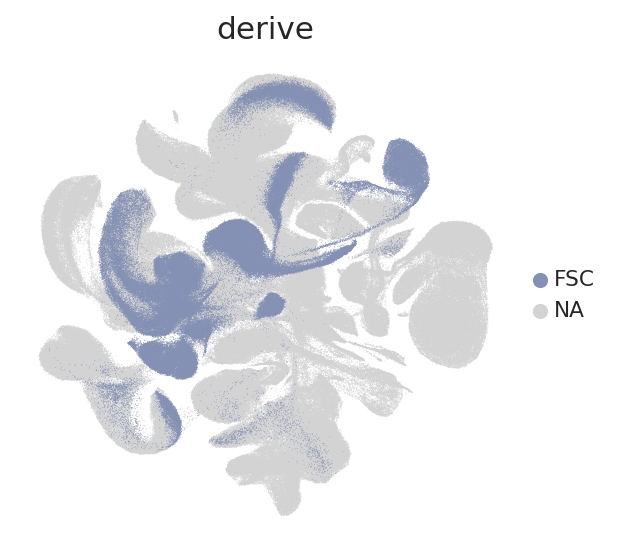

In [96]:
sc.pl.umap(embd, 
           color = ['derive'],
           groups = ['FSC'],
           ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5, frameon=False,
#            save = 'AlveolarAirwayDifferentiationTimecourse_map_heoa_ann_derive_FSC.png'
          )

In [ ]:
# sc.pl.umap(embd, 
#            color = ['publication',],
#            ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5,
#            groups = ['Chan_NatCommun_2022'],
# #            save = 'Chan_2022_COPD_map_allOrganoid_ann_tissue.png'
#           )

In [ ]:
# sc.pl.umap(embd[embd.obs.sample_id.isin(['Chan_NatCommun_2022_bronchial_organoids'])], 
#            color = ['publication',],
#            ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5,
           
# #            save = 'Chan_2022_COPD_map_allOrganoid_ann_tissue.png'
#           )

In [ ]:
# sc.pl.umap(embd[embd.obs.sample_id.isin(['Chan_NatCommun_2022_nasopharyngeal_organoids'])], 
#            color = ['publication',],
#            ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5,
          
# #            save = 'Chan_2022_COPD_map_allOrganoid_ann_tissue.png'
#           )

In [ ]:
# sc.pl.umap(embd, 
#            color = ['status',],
#            ncols = 2, wspace = 0.9, legend_fontsize= 'x-small', size = 0.5,
#            save = 'Chan_2022_COPD_map_allOrganoid_ann_status.png'
#           )

In [97]:
embd.obs.source.value_counts()

source
HEOA                                         806646
Airway-AlveolarDifferentiation timecourse     39372
Name: count, dtype: int64

In [99]:
import pynndescent
import numba

hcca_embd = embd[embd.obs.source.isin(['HEOA'])].copy()
query_emb = embd[embd.obs.source.isin(['Airway-AlveolarDifferentiation timecourse'])].copy()


X_train = hcca_embd.X
ref_nn_index = pynndescent.NNDescent(X_train)
ref_nn_index.prepare()

ref_neighbors, ref_distances = ref_nn_index.query(query_emb.X)

# convert distances to affinities
stds = np.std(ref_distances, axis=1)
stds = (2.0 / stds) ** 2
stds = stds.reshape(-1, 1)
ref_distances_tilda = np.exp(-np.true_divide(ref_distances, stds))
weights = ref_distances_tilda / np.sum(ref_distances_tilda, axis=1, keepdims=True)


@numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty


# for each annotation level, get prediction and uncertainty
label_keys = ['level_1','level_2','level_3']
for l in label_keys:
    ref_cats = hcca_embd.obs[l].cat.codes.to_numpy()[ref_neighbors]
    p, u = weighted_prediction(weights, ref_cats)
    p = np.asarray(hcca_embd.obs[l].cat.categories)[p]
    query_emb.obs[l + "_pred"], query_emb.obs[l + "_uncertainty"] = p, u
    
    
uncertainty_threshold = 0.3
# for l in label_keys:
#     mask = query_emb.obs[l + "_uncertainty"] > uncertainty_threshold
#     print(f"{l}: {sum(mask)/len(mask)} unknown")
#     query_emb.obs[l + "_pred"].loc[mask] = "Unknown"

/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


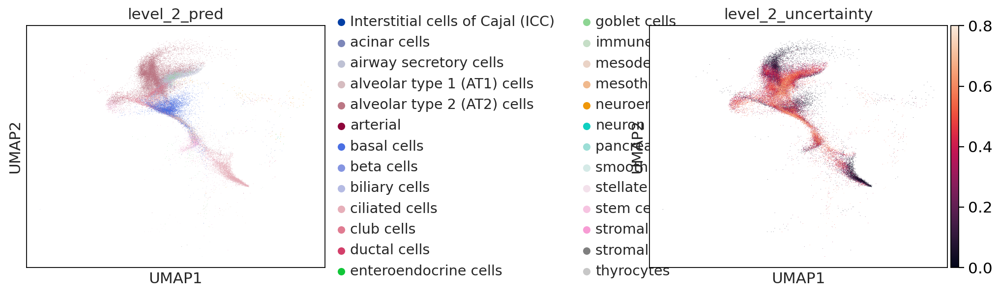

In [100]:
sc.pl.umap(query_emb, 
           color = ['level_2_pred',"level_2_uncertainty"],
           ncols = 2, wspace = 0.9, 
           #legend_fontsize= 'x-small',
           size = 0.5,
#            save = 'Chan_2022_COPD_map_allOrganoid_ann_status.png'
          )

In [101]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = [6, 4]
# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

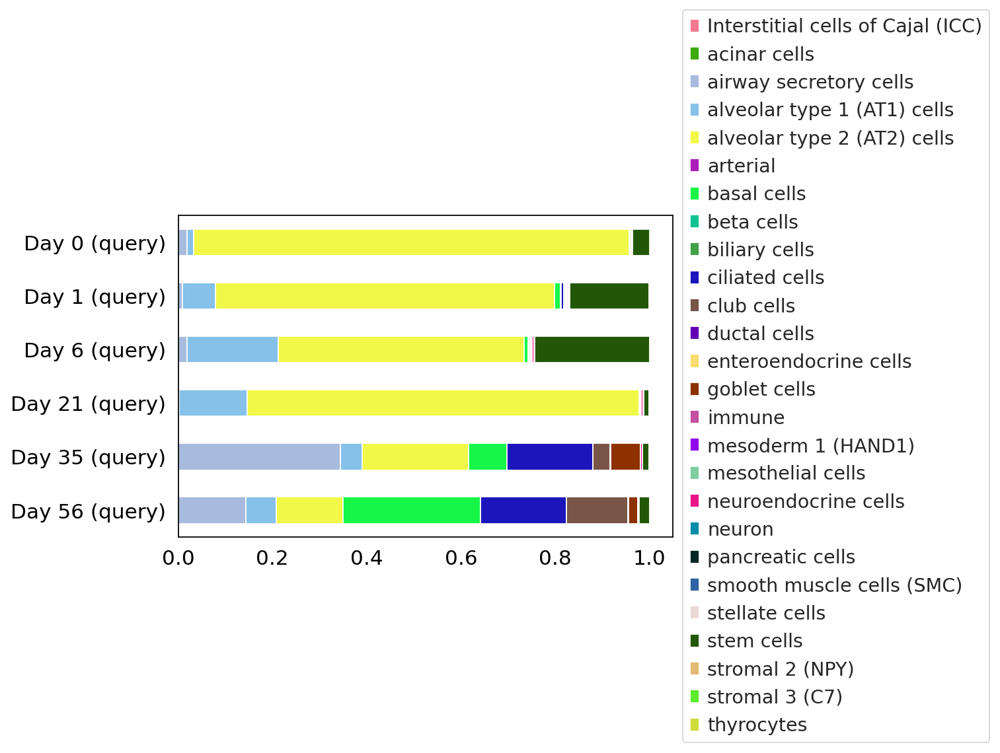

In [103]:
df = query_emb.obs.groupby(['group','level_2_pred']).size()/adata.obs.groupby(['group']).size()
df = df.unstack(fill_value=0)
order=['Day 56 (query)','Day 35 (query)','Day 21 (query)','Day 6 (query)', 'Day 1 (query)', 'Day 0 (query)',]
df.reindex(order).plot.barh(stacked=True, grid=False, color=col_map,ylabel='').legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

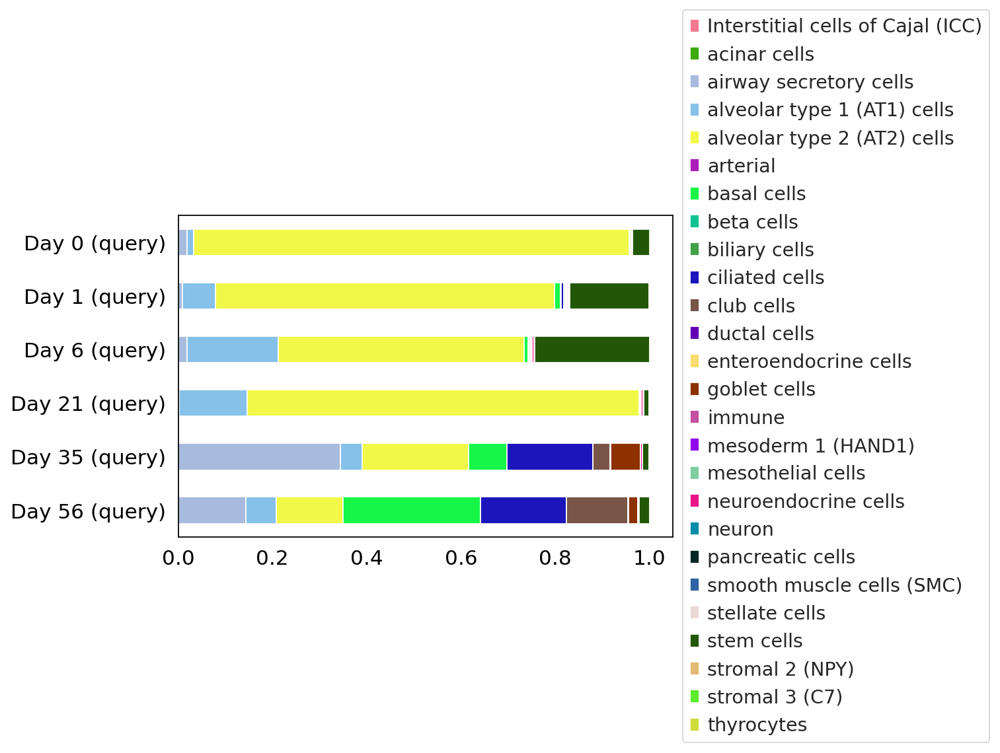

In [104]:
fig = df.reindex(order).plot.barh(stacked=True, 
                                  grid=False, 
                                  color=col_map,
                                  ylabel='',
                                 figsize=(6, 4)).legend(loc='center left',bbox_to_anchor=(1.0, 0.5)).get_figure()

fig.savefig('figures/AlveolarDifferentiationD0D1D6D21_map_allOrganoid_knn_pred_celltypes_110723.png', bbox_inches='tight')


In [105]:
# query_emb.obs

In [106]:
# not applicable

# fig, ax = plt.subplots(figsize=(6, 4))
# df = query_emb.obs
# g = sns.violinplot(data=df, x="level_2_pred", y="level_2_uncertainty", 
#                    hue="tissue", split=True,  inner=None)
# g.set_xticklabels(g.get_xticklabels(), rotation=90) 
# sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))


In [107]:
results_dict = scpoli_query.classify(adata.X, adata.obs.sample_id)

In [108]:
cell_type_key = ['level_1','level_2']

# for i in range(len(cell_type_key)):
#     preds = results_dict[cell_type_key[i]]["preds"]
#     results_dict[cell_type_key[i]]["uncert"]
#     classification_df = pd.DataFrame(
#         classification_report(
#             y_true=target_adata.obs[cell_type_key[i]],
#             y_pred=preds,
#             output_dict=True,
#         )
#     ).transpose()
# print(classification_df)

In [109]:
print(adata.shape)
print(query_emb.shape)

(39372, 2000)
(39372, 10)


In [110]:
#get label annotations
query_emb.obs['scpoli_cell_type_pred'] = results_dict['level_2']['preds'].tolist()
query_emb.obs['scpoli_cell_type_uncert'] = results_dict['level_2']['uncert'].tolist()


/home/theislab/l_zadeh/.conda/envs/scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


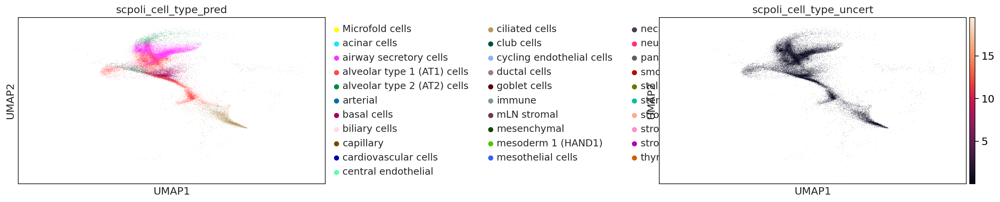

In [111]:
sc.pl.umap(query_emb, 
           color = ['scpoli_cell_type_pred',"scpoli_cell_type_uncert"],
           ncols = 2, wspace = 0.9, 
           #legend_fontsize= 'x-small',
           size = 0.5,
#            save = 'Chan_2022_COPD_map_allOrganoid_ann_status.png'
          )

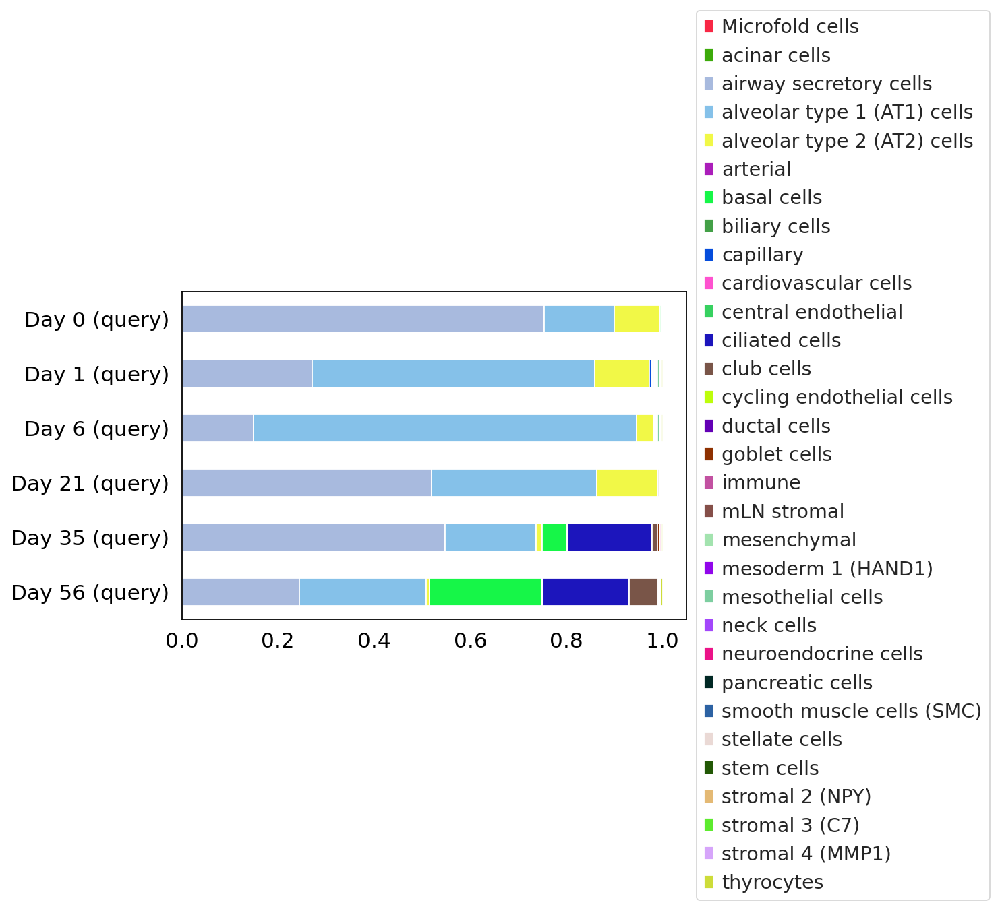

In [112]:
df = query_emb.obs.groupby(['group','scpoli_cell_type_pred']).size()/adata.obs.groupby(['group']).size()
df = df.unstack(fill_value=0)
# order=['Day 21','Day 6', 'Day 1', 'Day 0',]
df.reindex(order).plot.barh(stacked=True, grid=False, color=col_map,ylabel='').legend(loc='center left',bbox_to_anchor=(1.0, 0.5))

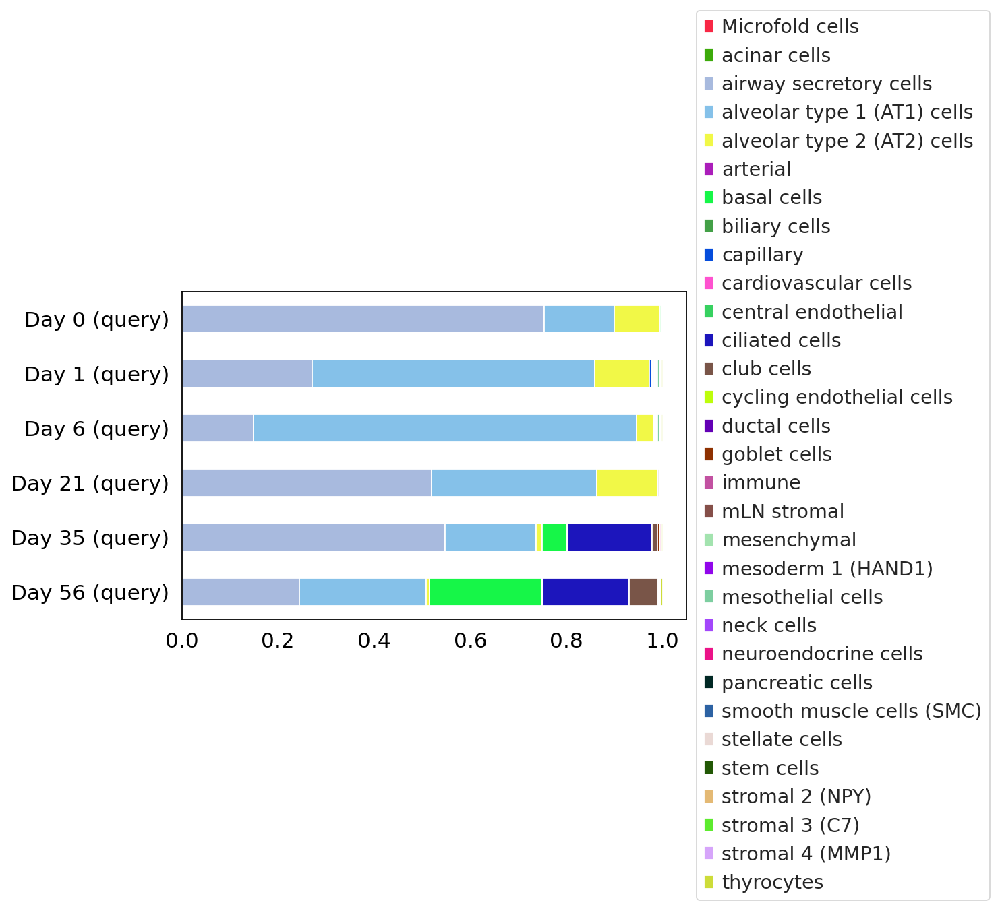

In [113]:
fig = df.reindex(order).plot.barh(stacked=True, 
                                  grid=False, 
                                  color=col_map,
                                  ylabel='',
                                 figsize=(6, 4)).legend(loc='center left',bbox_to_anchor=(1.0, 0.5)).get_figure()

fig.savefig('figures/AlveolarDifferentiationD0D1D6D21_map_allOrganoid_scpoli_pred_celltypes_110723.png', bbox_inches='tight')


In [115]:
embd.write('Airway_AlveolarDifferentiation_timecourse_map_heoa_latent_110723.h5ad')

### quantify uncertainty

In [ ]:
query_emb.obs.scpoli_cell_type_uncert.describe()

In [ ]:
celltype_tissue_dict = adata_latent.obs[['tissue','level_2']].groupby('tissue')['level_2'].apply(lambda g: g.values.unique().tolist()).to_dict()

In [ ]:
query_emb.obs.groupby('sample_id')

In [ ]:
# compare false transfers by standard knn and scpoli classifier
celltype_tissue_dict['lung']

pd.DataFrame({
#knn
'knn': query_emb.obs.groupby('sample_id')[['level_2_pred','level_2_uncertainty']].apply(lambda x: np.mean(~x.level_2_pred.isin(celltype_tissue_dict['lung']) & (x.level_2_uncertainty < 0.3))),
#scpoli
'scpoli':query_emb.obs.groupby('sample_id')[['scpoli_cell_type_pred','scpoli_cell_type_uncert']].apply(lambda x: np.mean(~x.scpoli_cell_type_pred.isin(celltype_tissue_dict['lung']) & (x.scpoli_cell_type_uncert < 0.3)))
    
    
})

In [ ]:

# fig, ax = plt.subplots(figsize=(20, 6))
# g = sns.violinplot(data=df, x="scpoli_cell_type_pred", y="scpoli_cell_type_uncert", 
#                    hue="tissue", split=True,  inner=None, aspect=1.5)
# g.set_xticklabels(g.get_xticklabels(), rotation=45) 
# sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

In [ ]:
emb = ad.concat([hcca_embd, query_emb], axis = 0)

In [ ]:
emb

In [ ]:
emb.obs.columns

In [ ]:
query_emb.obs

In [ ]:
emb.obs.source.value_counts()

In [ ]:
emb.obs['level_2_uncertainty'] = np.nan
emb.obs.loc[emb.obs.source.isin(['AlveolarDifferentiationD0D1D6D21']),'level_2_uncertainty'] = query_emb.obs.level_2_uncertainty

In [ ]:
emb.obs['level_3_uncertainty'] = np.nan
emb.obs.loc[emb.obs.source.isin(['AlveolarDifferentiationD0D1D6D21']),'level_3_uncertainty'] = query_emb.obs.level_3_uncertainty

In [ ]:
import matplotlib as mpl

sc.pl.umap(emb, 
           color = ['group', 'level_2_uncertainty'], # 'level_3_uncertainty'
           ncols = 2, wspace = 0.6, legend_fontsize= 'x-small', size = 3,
           groups = ['Day 0','Day 1', 'Day 6', 'Day 26'], frameon=False,
           color_map = mpl.colormaps['cividis'],
#            save = 'Chan_2022_COPD_map_allOrganoid_ann_tissue.png'
          )

In [ ]:
# celltype composition per sample
query_emb.obs

In [ ]:
query_emb.obs.groupby('sample_id')[['scpoli_cell_type_pred']].plot(kind="bar", stacked=True)

In [ ]:
query_emb.obs.groupby('sample_id')[['scpoli_cell_type_pred']].describe()